In [2]:
from pathlib import Path
import re
import os
import time
import pickle
import shutil
import numpy as np
import pandas as pd
from numpy.linalg import norm
from tqdm import tqdm, tqdm_notebook
import math

# Visualization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
from PIL import Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
%matplotlib inline 

# Model Building
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


In [5]:
# Change file names of images
at_home_dir = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images')
os.chdir(at_home_dir.parent)
print(Path.cwd())
img_folders = list(at_home_dir.glob('*'))
img_folders
# for emo in tqdm(img_folders):
#     for idx, img in enumerate(emo.glob('*')):
#         img.rename(img.with_name(str(idx) + img.suffix))

D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master


[WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/disgust human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/happy human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/sad human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/scared human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/surprise human face')]

In [4]:
# Feature Extraction
model = MobileNetV2(weights='imagenet', include_top=False,
                 input_shape=(224, 224, 3))
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path, target_size=(
        input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features

In [62]:
feature_list = []
corrupted_imgs = []
for emo in tqdm(img_folders):
    for img in emo.glob('*'):
        try:
            feature_list.append((img,extract_features(img, model)))
        except Exception as e:
            corrupted_imgs.append(img)

    

100%|██████████| 7/7 [03:05<00:00, 26.55s/it]


In [88]:
corrupted = []
input_shape = (224, 224, 3)
for emo in tqdm(img_folders):
    for img in emo.glob('*'):
        try:
            im = image.load_img(img, target_size=(
        input_shape[0], input_shape[1]))
        except:
            corrupted.append(img)

100%|██████████| 7/7 [00:59<00:00,  8.47s/it]


In [97]:
# Move corrupted images to a different folders
import shutil
for img in corrupted:
    try:
        emotion = Path(img.parent.name)
        dest = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\corrupted_imgs')
        dest = dest / emotion
        dest.mkdir(exist_ok=True)
        shutil.move(str(img), dest)
    except Exception as e:
        print(e)

In [64]:
features = []
imgs = []
for img, feature in tqdm(feature_list):
    features.append(feature)
    imgs.append(img)

100%|██████████| 2596/2596 [00:00<00:00, 867740.93it/s]


In [8]:
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(string):
    return string


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(str(at_home_dir / filename)))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)

## Visualizing Clusters with t-SNE

In [111]:
len(class_ids)

2595

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2595 samples in 0.114s...
[t-SNE] Computed neighbors for 2595 samples in 2.879s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2595
[t-SNE] Computed conditional probabilities for sample 2000 / 2595
[t-SNE] Computed conditional probabilities for sample 2595 / 2595
[t-SNE] Mean sigma: 0.178382
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.005539
[t-SNE] KL divergence after 1000 iterations: 1.766367


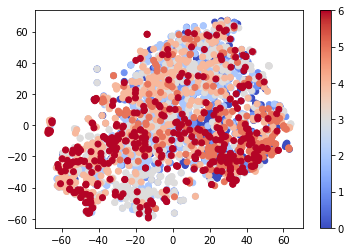

In [19]:

# Perform PCA over the features
num_feature_dimensions=100      # Set the number of features
pca = PCA(n_components = num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)
imgs = round(len(class_ids) / 2)
# For speed and clarity, we'll analyze about first half of the dataset.
# selected_features = feature_list_compressed[:imgs]
# selected_class_ids = class_ids[:imgs]
# selected_filenames = filenames

tsne_results = TSNE(n_components=2,verbose=1,metric='euclidean').fit_transform(feature_list_compressed)

# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1], c =
               class_ids, cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()

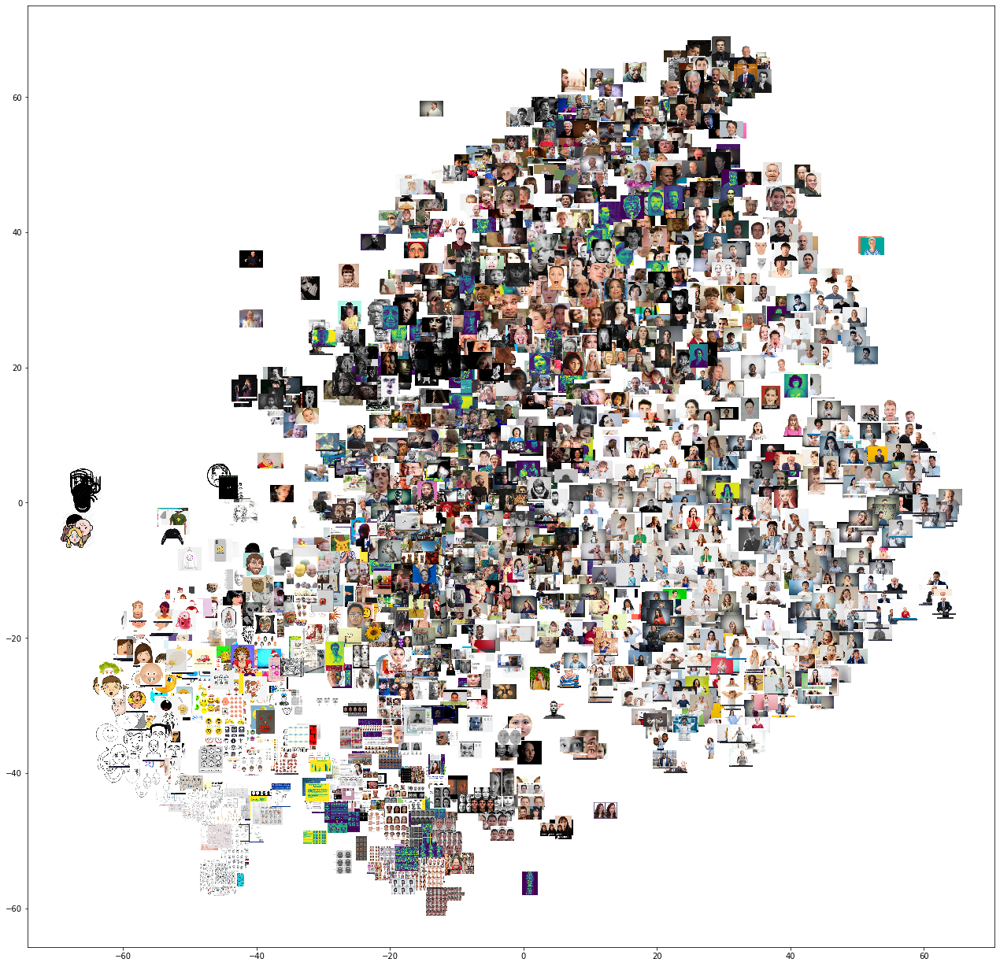

['angry human face\\116.png',
 'happy human face\\145.png',
 'neutral human face\\217.png',
 'neutral human face\\308.png',
 'neutral human face\\387.png',
 'neutral human face\\421.png',
 'sad human face\\147.png']

In [20]:


img_dir = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images')
def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    error = []
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        try:
            image = Image.open(img_dir / Path(image_path))
            image.thumbnail((100, 100), Image.ANTIALIAS)
            img = OffsetImage(image, zoom=zoom)
            anno_box = AnnotationBbox(img, (x0, y0),
                                    xycoords='data',
                                    frameon=False)
            axis.add_artist(anno_box)
        except Exception as e:
            # print(e)
            error.append(image_path)
        
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()
    return error

def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    error = plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)

        
    plt.show()
    return error
# Images that cannot be shown
error = show_tsne(tsne_results[:, 0], tsne_results[:, 1], filenames)
error

---

## K-means clustering and PCA to sort out non-facial images

In [5]:
print(np.array(filenames).shape)
print(np.array(feature_list).shape)

(2595,)
(2595, 62720)


In [6]:
# Put images into a dataframe for easy processing
import pandas as pd

im_df = pd.DataFrame(feature_list)
im_df['names'] = filenames




In [7]:
# Perform PCA over all the features
num_feature_dimensions=2595      # Set the number of features
pca = PCA(n_components = num_feature_dimensions)
pca.fit(im_df.iloc[:,:-1])
feature_list_compressed = pca.transform(im_df.iloc[:,:-1])
X_train_PCA = pd.DataFrame(data=feature_list_compressed)
X_train_PCA['names'] = im_df['names']

In [9]:
print("Variance Explained by all principal components: ", \
      sum(pca.explained_variance_ratio_))

Variance Explained by all principal components:  0.9999999808779216


In [10]:
importanceOfPrincipalComponents = pd.DataFrame(data=pca.explained_variance_ratio_)
importanceOfPrincipalComponents = importanceOfPrincipalComponents.T

In [11]:
print('Variance Captured by First 10 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:100].sum(axis=1).values)
print('Variance Captured by First 200 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:200].sum(axis=1).values)
print('Variance Captured by First 300 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:300].sum(axis=1).values)
print('Variance Captured by First 400 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:400].sum(axis=1).values)
print('Variance Captured by First 500 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:500].sum(axis=1).values)
print('Variance Captured by First 600 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:600].sum(axis=1).values)
print('Variance Captured by First 1000 Principal Components: ',
        importanceOfPrincipalComponents.loc[:,0:1000].sum(axis=1).values)
print('Variance Captured by First 2000 Principal Components: ',
        importanceOfPrincipalComponents.loc[:,:2000].sum(axis=1).values)

Variance Captured by First 10 Principal Components:  [0.355567]
Variance Captured by First 200 Principal Components:  [0.45514297]
Variance Captured by First 300 Principal Components:  [0.52384746]
Variance Captured by First 400 Principal Components:  [0.5778455]
Variance Captured by First 500 Principal Components:  [0.6228882]
Variance Captured by First 600 Principal Components:  [0.6618638]
Variance Captured by First 1000 Principal Components:  [0.7808224]
Variance Captured by First 2000 Principal Components:  [0.9529649]


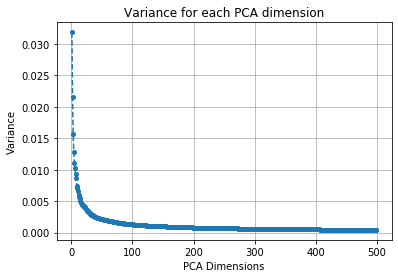

In [19]:
plt.plot(range(1,500),pca.explained_variance_ratio_[:499],'o--', markersize=4)
plt.title ('Variance for each PCA dimension')
plt.xlabel('PCA Dimensions')
plt.ylabel('Variance')
plt.grid(True)
plt.show()

100 seems like a plausible choice for the number of dimensions used in PCA

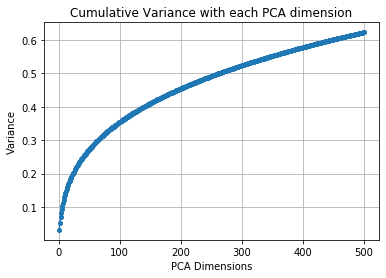

In [22]:

plt.plot(range(1,500+1),pca.explained_variance_ratio_.cumsum()[:500],'o--', markersize=4)
plt.title ('Cumulative Variance with each PCA dimension')
plt.xlabel('PCA Dimensions')
plt.ylabel('Variance')
plt.grid(True)
plt.show()

In [27]:
from sklearn.cluster import KMeans
cutoff = 200
# n_init = 10
max_iter = 300
tol = 0.0001
random_state = 2018
n_jobs = 3

kMeans_inertia = pd.DataFrame(data=[],index=range(2,21), \
                              columns=['inertia'])
for n_clusters in range(2,70):
    kmeans = KMeans(n_clusters=n_clusters, max_iter=max_iter, tol=tol, random_state=random_state, \
                n_jobs=n_jobs)
    kmeans.fit(X_train_PCA.iloc[:,0:cutoff])
    kMeans_inertia.loc[n_clusters] = kmeans.inertia_

---

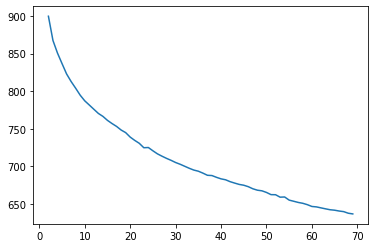

In [28]:
plt.plot(kMeans_inertia)

In [31]:
cutoff = 100
# n_init = 10
max_iter = 300
tol = 0.0001
random_state = 2018
n_jobs = 3

kMeans_inertia = pd.DataFrame(data=[],index=range(2,21), \
                              columns=['inertia'])
for n_clusters in range(2,70):
    kmeans = KMeans(n_clusters=n_clusters, max_iter=max_iter, tol=tol, random_state=random_state, \
                n_jobs=n_jobs)
    kmeans.fit(X_train_PCA.iloc[:,0:cutoff])
    kMeans_inertia.loc[n_clusters] = kmeans.inertia_

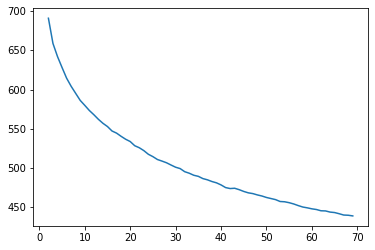

In [32]:
plt.plot(kMeans_inertia)

In [26]:
for i in range(1, 21, 1):
    group1 = X_train_PCA.loc[y_km==i,'names']
    print(f'The number of images in cluster {i} is\t:', len(group1.values))

The number of images in cluster 1 is	: 188
The number of images in cluster 2 is	: 153
The number of images in cluster 3 is	: 128
The number of images in cluster 4 is	: 188
The number of images in cluster 5 is	: 179
The number of images in cluster 6 is	: 119
The number of images in cluster 7 is	: 166
The number of images in cluster 8 is	: 80
The number of images in cluster 9 is	: 81
The number of images in cluster 10 is	: 150
The number of images in cluster 11 is	: 79
The number of images in cluster 12 is	: 164
The number of images in cluster 13 is	: 316
The number of images in cluster 14 is	: 22
The number of images in cluster 15 is	: 105
The number of images in cluster 16 is	: 35
The number of images in cluster 17 is	: 86
The number of images in cluster 18 is	: 114
The number of images in cluster 19 is	: 73
The number of images in cluster 20 is	: 0


## Removing Non-Facial Images

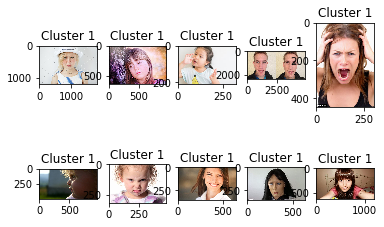

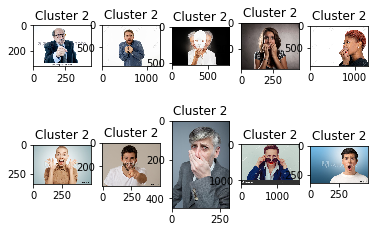

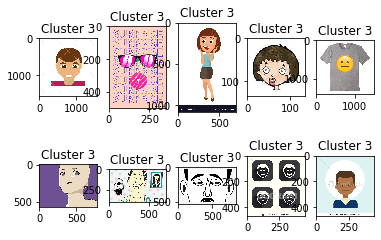

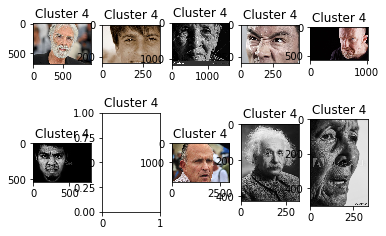

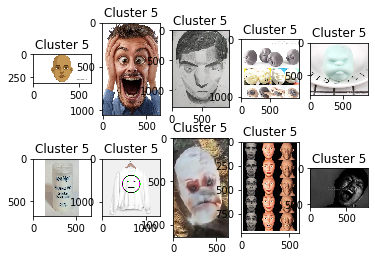

...

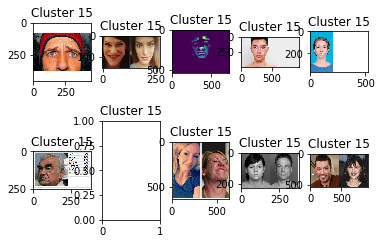

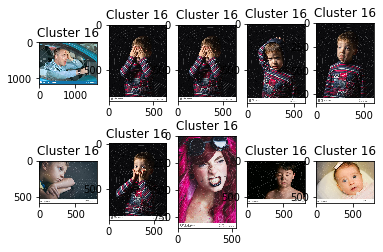

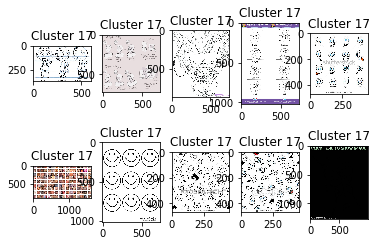

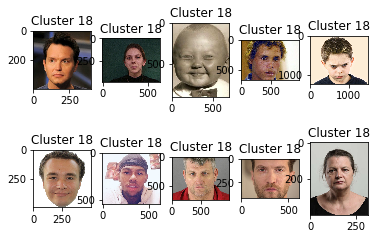

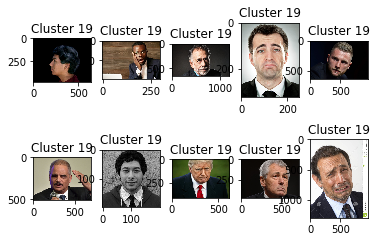

In [27]:
from random import sample
import matplotlib.image as mpimg
invalid = []
for i in range(1,21,1):
    group1 = X_train_PCA.loc[y_km==i,'names']
    if len(group1) == 0:
        pass
    else:
        small_sample = sample(list(group1.values), 10)
        fig = plt.figure()
        for idx, im in enumerate(small_sample):
            ax = fig.add_subplot(2,5,idx+1)
            ax.set_title(f'Cluster {i}')
            try:
                im = mpimg.imread(str(at_home_dir / im))
                ax.imshow(im)
            except ValueError as e:
                invalid.append(str(at_home_dir / im))

In [39]:
# E = Path(r'E:\similarity_search')
# dest = r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-masterimgs'
# list(E.glob('*face'))
# for folder in list(E.glob('*face')):
#     for im in list(folder.glob('*')):
#         dest1 = dest / Path(im.parent.name + '/'+ im.name)
#         dest1.mkdir(exist_ok=True,parents=True)
#         shutil.copy(str(im), dest1) 

### Manual Checking to ensure good clustering

In [49]:
potential_outliers = [3,5,8,9,11,14,17,18]
correction = Path('./needsCorrecting')
# Copy imgs to separate folders
for idx, val in enumerate(potential_outliers):
    group1 = X_train_PCA.loc[y_km==val,'names']
    dest = correction / str(val)
    dest.mkdir(parents=True,exist_ok = True)
    for im in list(group1):
        sub_folder = im.split('\\')[0]
        dest1 = dest / sub_folder
        dest1.mkdir(exist_ok=True, parents=True)
        shutil.copy(str(at_home_dir / im), str(dest1))
        # print(str(at_home_dir / im))
        # print(str(dest / im))

### Remove Images

In [96]:
# total imgs to be removed
sum = 0
remove = []
for i in list(correction.glob('*')):
    print(i)
    print(len(list(i.glob('*/*'))))
    sum += len(list(i.glob('*/*')))
print(sum)

needsCorrecting\11
79
needsCorrecting\14
22
needsCorrecting\17
86
needsCorrecting\3
128
needsCorrecting\5
173
needsCorrecting\8
66
needsCorrecting\9
63
617


In [70]:
# Total imgs before removing
sum = 0
for i in list(at_home_dir.glob('*')):
    print(i)
    print(len(list(i.glob('**/*'))))
    sum += len(list(i.glob('**/*')))
print(sum)

297
281
460
463
474
235
386
2596


In [ ]:
p = Path('./needsCorrecting')
for i in p.glob('**/*'):
     if Path(i).is_dir() == False:
         to_be_removed = at_home_dir / i.parent.name  /  i.name
         try:
            to_be_removed.unlink()
         except FileNotFoundError:
             print('File not exist')

In [93]:
sum = 0
for i in list(at_home_dir.glob('*')):
    print(i)
    print(len(list(i.glob('*'))))
    sum += len(list(i.glob('*')))
print(sum)

D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images\angry human face
284
D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images\disgust human face
268
D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images\happy human face
336
D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images\neutral human face
309
D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images\sad human face
308
D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images\scared human face
227
D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images\surprise human face
247
1979


## Image Duplicate Search

In [41]:
model = MobileNetV2(weights='imagenet', include_top=False,
                 input_shape=(224, 224, 3))
batch_size = 64
root_dir = at_home_dir
datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

generator = datagen.flow_from_directory(root_dir,
                                        target_size=(224, 224),
                                        batch_size=batch_size,
                                        class_mode=None,
                                        shuffle=False)

num_images = len(generator.filenames)
num_epochs = int(math.ceil(num_images / batch_size))

start_time = time.time()
feature_list = []
feature_list = model.predict_generator(generator, num_epochs)
end_time = time.time()

Found 1978 images belonging to 7 classes.


In [43]:
for i, features in enumerate(feature_list):
    feature_list[i] = features / norm(features)

feature_list = feature_list.reshape(num_images, -1)

print("Num images   = ", len(generator.classes))
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in sec = ", end_time - start_time)
# Serialize features into pickle files
path = Path('./data')
path.mkdir(exist_ok=True)
pickle.dump(generator.classes, open('./data/refiend_class_ids.pickle',
                                    'wb'))
pickle.dump(generator.filenames, open('./data/refined_filenames.pickle', 'wb'))
pickle.dump(
    feature_list,
    open('./data/refined_features-' + 'mobilenetv2' + '.pickle', 'wb'))

Num images   =  1978
Shape of feature_list =  (1978, 62720)
Time taken in sec =  70.27771711349487


In [14]:
filenames = pickle.load(open('data/refined_filenames.pickle', 'rb'))
feature_list = pickle.load(open('./data/refined_features-' + 'mobilenetv2' + '.pickle', 'rb'))
class_ids = pickle.load(open('./data/refiend_class_ids.pickle', 'rb')) 

In [15]:
neighbors = NearestNeighbors(n_neighbors=5, algorithm='brute',
metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors([feature_list[0]])

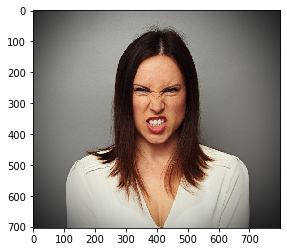

In [16]:
plt.imshow(mpimg.imread(at_home_dir / filenames[0]))

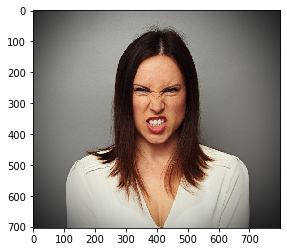

In [17]:
plt.imshow(mpimg.imread(at_home_dir / filenames[indices[0][0]]))

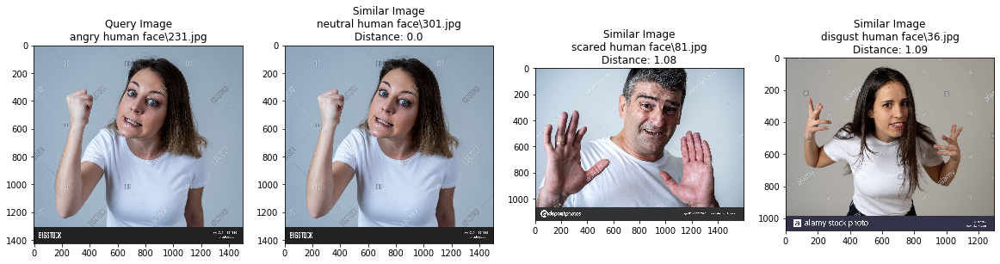

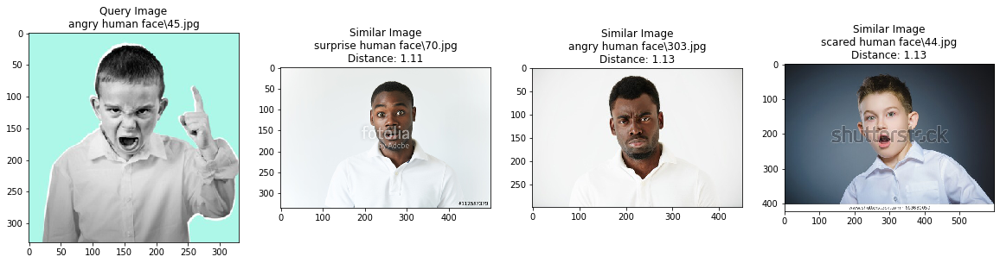

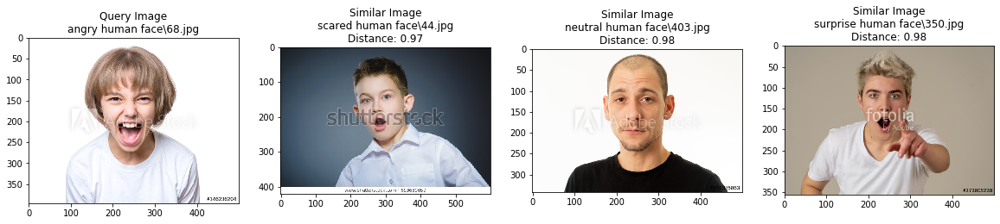

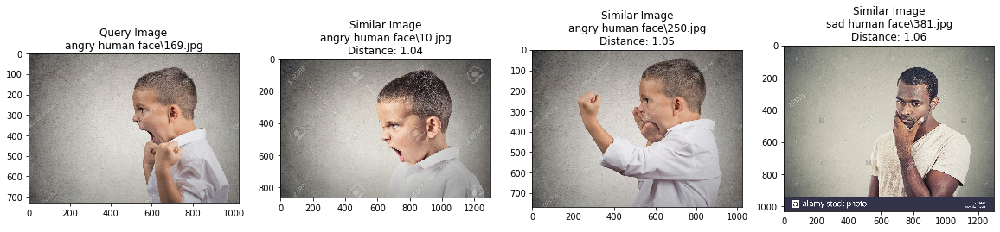

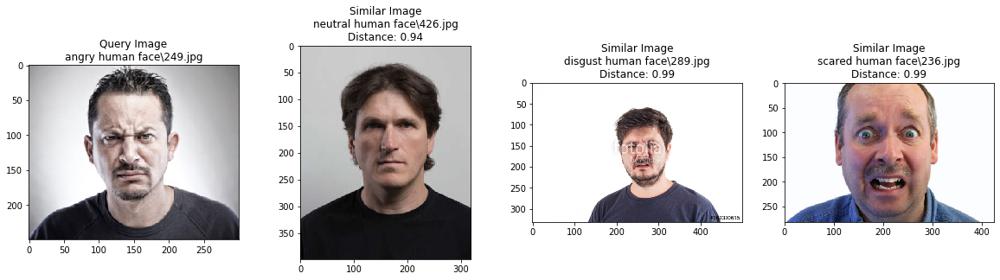

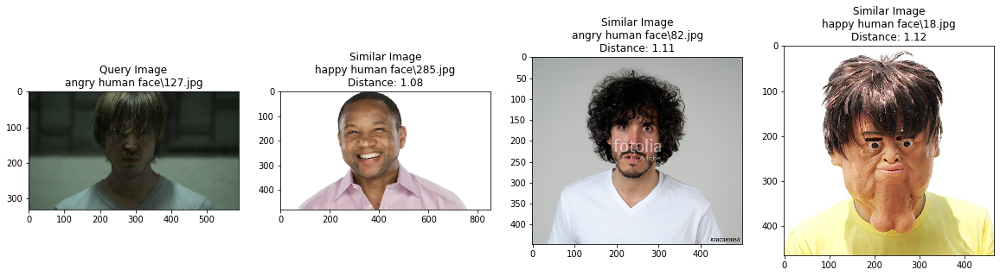

In [18]:
from numpy import random
num_images = 300
for i in range(6):
    random_image_index = random.randint(0,num_images)
    distances, indices = neighbors.kneighbors([feature_list[random_image_index]])
    # don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] +[filenames[indices[0][i]] for i in range(1,4)]
    plot_images(similar_image_paths, distances[0])

If the model performs well, the 1st nearest neighbor should be itself. However, the sampled images show that the model doesn't perform well on the pretrained feature embeddings. Let's fine-tune the pretrained model and see if that could be improved.

In [4]:
# Helper function to get the classname
def classname(str):
    return str.split('\\')[-2]
def get_least_accurate_classes(feature_list):
    per_class_acc = {}
    num_nearest_neighbors = 5
    num_correct_predictions = 0
    num_incorrect_predictions = 0
    neighbors = NearestNeighbors(n_neighbors=num_nearest_neighbors,
                                 algorithm='brute',
                                 metric='euclidean').fit(feature_list)
    for i in tqdm(range(len(feature_list))):
        distances, indices = neighbors.kneighbors([feature_list[i]])
        for j in range(1, num_nearest_neighbors):
            try:
                predicted_class = classname(filenames[indices[0][j]])
                ground_truth = classname(filenames[i])
                if (predicted_class not in per_class_acc):
                    per_class_acc[predicted_class] = [0, 0, 0]
                if ground_truth == predicted_class:
                    num_correct_predictions += 1
                    per_class_acc[predicted_class][0] += 1
                    per_class_acc[predicted_class][2] += 1
                else:
                    num_incorrect_predictions += 1
                    per_class_acc[predicted_class][1] += 1
                    per_class_acc[predicted_class][2] += 1
            except IndexError:
                print(filenames[indices[0][j]])
    print(
        "Accuracy is ",
        round(
            100.0 * num_correct_predictions /
            (1.0 * num_correct_predictions + num_incorrect_predictions), 2))
    for key, value in per_class_acc.items():
        per_class_acc[key] = round(100.0 * value[0] / (1.0 * value[2]), 2)
    dic = sorted(per_class_acc, key=per_class_acc.get)

    # least_accurate classes
    print("\n\nTop 10 incorrect classifications\n")
    for key in dic[:10]:
        print(key, "\tAccuracy: ", per_class_acc[key])
    return dic[:6], per_class_acc

In [5]:
names_of_least_accurate_classes_before_finetuning, accuracy_per_class_before_finetuning = get_least_accurate_classes(
    feature_list[:])

100%|█████████▉| 1976/1978 [36:05<00:02,  1.05s/it]

In [19]:
# Helper function to get the classname
def classname(str):
    return str.split('\\')[-2]
def get_least_accurate_classes(feature_list):
    per_class_acc = {}
    num_nearest_neighbors = 5
    num_correct_predictions = 0
    num_incorrect_predictions = 0
    neighbors = NearestNeighbors(n_neighbors=num_nearest_neighbors,
                                 algorithm='brute',
                                 metric='euclidean', n_jobs=6).fit(feature_list)
    for i in tqdm(range(len(feature_list))):
        distances, indices = neighbors.kneighbors([feature_list[i]])
        for j in range(1, num_nearest_neighbors):
            try:
                predicted_class = classname(filenames[indices[0][j]])
                ground_truth = classname(filenames[i])
                if (predicted_class not in per_class_acc):
                    per_class_acc[predicted_class] = [0, 0, 0]
                if ground_truth == predicted_class:
                    num_correct_predictions += 1
                    per_class_acc[predicted_class][0] += 1
                    per_class_acc[predicted_class][2] += 1
                else:
                    num_incorrect_predictions += 1
                    per_class_acc[predicted_class][1] += 1
                    per_class_acc[predicted_class][2] += 1
            except IndexError:
                print(filenames[indices[0][j]])
    print(
        "Accuracy is ",
        round(
            100.0 * num_correct_predictions /
            (1.0 * num_correct_predictions + num_incorrect_predictions), 2))
    for key, value in per_class_acc.items():
        per_class_acc[key] = round(100.0 * value[0] / (1.0 * value[2]), 2)
    dic = sorted(per_class_acc, key=per_class_acc.get)

    # least_accurate classes
    print("\n\nTop 10 incorrect classifications\n")
    for key in dic[:10]:
        print(key, "\tAccuracy: ", per_class_acc[key])
    return dic[:6], per_class_acc

In [20]:
names_of_least_accurate_classes_before_finetuning, accuracy_per_class_before_finetuning = get_least_accurate_classes(
    feature_list[:])

100%|██████████| 1978/1978 [21:47<00:00,  1.51it/s]Accuracy is  29.27


Top 10 incorrect classifications

disgust human face 	Accuracy:  23.17
angry human face 	Accuracy:  25.42
surprise human face 	Accuracy:  28.26
scared human face 	Accuracy:  29.62
sad human face 	Accuracy:  30.81
neutral human face 	Accuracy:  33.13
happy human face 	Accuracy:  34.3



In [6]:
import cv2

def dhash(image, hashSize=8):
	# resize the input image, adding a single column (width) so we
	# can compute the horizontal gradient
	resized = cv2.resize(image, (hashSize + 1, hashSize))

	# compute the (relative) horizontal gradient between adjacent
	# column pixels
	diff = resized[:, 1:] > resized[:, :-1]

	# convert the difference image to a hash
	return sum([2 ** i for (i, v) in enumerate(diff.flatten()) if v])



In [14]:
all_files = at_home_dir.glob('**/*')
imgs = [x for x in all_files if x.is_file()]
hashes = {}
start = time.time()
for im in imgs:
    image = cv2.imread(str(im))
    if image is None:
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    imageHash = dhash(image)
    # TODO: Need to implement dhash <10 to find similar images
    hashes[im] = imageHash

NameError: name 'img' is not defined

In [15]:
hashes.get(imgs[0], [])

1669548393924076295

In [31]:
def get_key(val, mydict): 
    for key, value in mydict.items(): 
         if val == value: 
             return key 
    return "key doesn't exist"
test = list(hashes.values())[0]
get_key(test, mydict=hashes)

WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face/0.jpeg')

In [46]:
def hammingDistance(n1, n2) : 
  
    x = n1 ^ n2  
    setBits = 0
  
    while (x > 0) : 
        setBits += x & 1
        x >>= 1
      
    return setBits 
# hash1 = hashes[duplicates[0][0]]
# hash2 = hashes[duplicates[0][1]]
# hamming(hash1,hash2)
def get_key(val, mydict): 
    for key, value in mydict.items(): 
         if val == value: 
             return key 
    return "key doesn't exist"
  
dup = {}
for hash1 in list(hashes.values()):
    dup[hash1] = [get_key(hash1, hashes)]
    for hash2 in list(hashes.values()):
        if hammingDistance(hash1, hash2) < 10:
            # print('dist:\t', hammingDistance(hash1, hash2))
            dup[hash1].append(get_key(hash2, hashes))
            

0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 7
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 9
dist:	 9
dist:	 9
dist:	 0
dist:	 0
dist:	 0
dist:	 6
dist:	 9
dist:	 0
dist:	 0
dist:	 0
dist:	 5
dist:	 0
dist:	 0
dist:	 0
dist: 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist: 0
dist:	 0
dist:	 0
dist:	 8
dist:	 6
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 8
dist:	 6
dist:	 0
dist:	 9
dist:	 9
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 9
dist:	 0
dist: 0
dist:	 0
dist:	 7
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist: 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist: 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist: 0
dist:	 0
dist:	 0
dist:	 0
dist:	 0
dist:

sPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/169.jpg')],
 2624672764443336913: [WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/17.jpg'),
  WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/17.jpg')],
 85870991453156610: [WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/171.jpg'),
  WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/171.jpg')],
 1034472335856054078: [WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/172.png'),
  WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/172.png')],
 2620335608260

In [54]:
not_present = []
for hash1 in list(dup.keys()):
    if hash1 in list(hashes.values()):
        continue
    else
        not_present.append(get_key(hash1, hashes))
not_present

[]

In [52]:
dup[589768516665316835]

[WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/surprise human face/99.jpeg'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/surprise human face/99.jpeg')]

In [8]:
duplicates = []
count = 0
for dup in dups.values():
    if len(dup) > 1:
        duplicates.append(dup)
        count +=1
print(count)
print(duplicates)

46
[[WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face/0.jpeg'), WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/happy human face/16.jpeg')], [WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face/123.jpeg'), WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/disgust human face/271.jpeg')], [WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face/152.png'), WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face/478.png')], [WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face/156.jpg'), WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-S

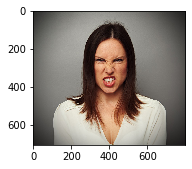

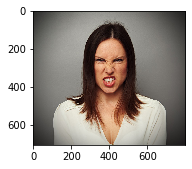

In [10]:
for idx, dup in enumerate(duplicates[0]):
    fig = plt.figure()
    ax = fig.add_subplot(1,2,idx+1)
    im = mpimg.imread(str(dup))
    ax.imshow(im)